# Part 1

In [0]:
pip install newspaper3k

In [0]:
!pip install -U sentence-transformers

Requirement already up-to-date: sentence-transformers in /usr/local/lib/python3.6/dist-packages (0.2.6.1)


<Figure size 432x288 with 0 Axes>

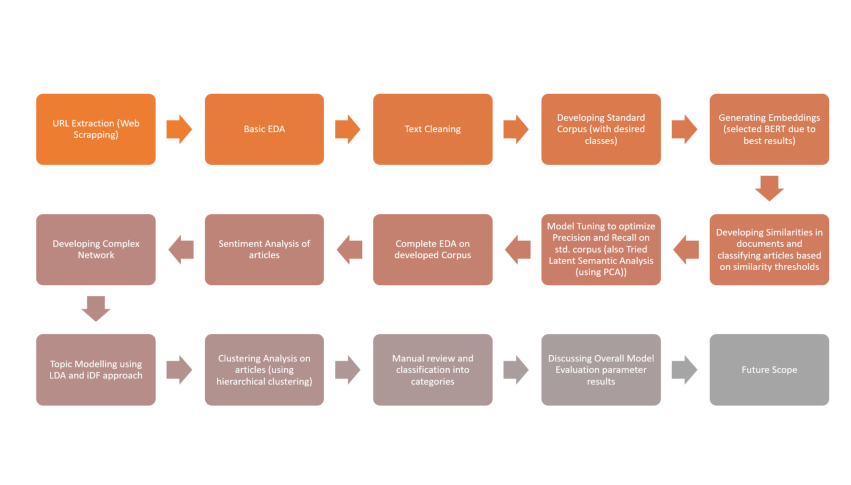

In [0]:
import matplotlib.image as mpimg 
import matplotlib.pyplot as plt

img = mpimg.imread('/content/drive/My Drive/DSL/images/image_2.png') 
plt.figure()
plt.figure(figsize=(15,10))
plt.axis("off")
plt.imshow(img) 

### Importing Necessary Packages

In [0]:
import requests
import re
from nltk.sentiment import SentimentAnalyzer
from nltk.sentiment.util import extract_unigram_feats, mark_negation
from nltk.sentiment.vader import SentimentIntensityAnalyzer as SIA
from nltk.stem import WordNetLemmatizer
from textblob import TextBlob
from nltk.stem import PorterStemmer
from nltk.corpus import stopwords
from bs4 import BeautifulSoup

import nltk
nltk.download('punkt')
nltk.download('vader_lexicon')
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('averaged_perceptron_tagger')

import pandas as pd
import numpy as np
import pandas as pd
from newspaper import Article 
import newspaper
from tqdm import tqdm

from sklearn.feature_extraction.text import TfidfVectorizer
import gensim
from sentence_transformers import SentenceTransformer
from sklearn import preprocessing
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.feature_extraction.text import CountVectorizer
from gensim import matutils, models
import scipy.sparse

from wordcloud import WordCloud
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image

import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
from nltk import word_tokenize, pos_tag

from sklearn.feature_extraction import text
from sklearn.feature_extraction.text import CountVectorizer

from sklearn.model_selection import train_test_split,KFold,StratifiedKFold,GridSearchCV,RandomizedSearchCV,cross_val_score
from sklearn.ensemble import RandomForestClassifier,BaggingClassifier,AdaBoostClassifier,GradientBoostingClassifier,RandomForestRegressor,BaggingRegressor,AdaBoostRegressor,GradientBoostingRegressor
from sklearn.linear_model import LinearRegression,LogisticRegression,Lasso, Ridge
from sklearn.tree import DecisionTreeClassifier,DecisionTreeRegressor
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier,KNeighborsRegressor
import sklearn.metrics as metrics
from sklearn.metrics import r2_score,roc_auc_score,classification_report,mean_squared_error,accuracy_score,confusion_matrix
import sklearn.ensemble as ensemb
import sklearn.metrics as metrics
from xgboost import XGBClassifier
from sklearn.ensemble import VotingClassifier, AdaBoostClassifier
from lightgbm import LGBMClassifier

import warnings
warnings.filterwarnings('ignore')

# url = "http://gstcouncil.gov.in/compendium-articles-gst"
# r = requests.get(url)
# soup = BeautifulSoup(r.content, 'html5lib')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package vader_lexicon to /root/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


### Defining Used Functions

In [0]:
# FUNCTION TO CLEAN TEXT

contraction_mapping = {"cr":"crore", "cr.":"crore", "rs": "rupees",
                           "ain't": "is not", "aren't": "are not","can't": "cannot", "'cause": "because", "could've": "could have", "couldn't": "could not",
                           "didn't": "did not", "doesn't": "does not", "don't": "do not", "hadn't": "had not", "hasn't": "has not", "haven't": "have not",
                           "he'd": "he would","he'll": "he will", "he's": "he is", "how'd": "how did", "how'd'y": "how do you", "how'll": "how will", "how's": "how is",
                           "I'd": "I would", "I'd've": "I would have", "I'll": "I will", "I'll've": "I will have","I'm": "I am", "I've": "I have", "i'd": "i would",
                           "i'd've": "i would have", "i'll": "i will",  "i'll've": "i will have","i'm": "i am", "i've": "i have", "isn't": "is not", 'said':'', "it'd": "it would",
                           "it'd've": "it would have", "it'll": "it will", "it'll've": "it will have","it's": "it is", "let's": "let us", "ma'am": "madam",
                           "mayn't": "may not", "might've": "might have","mightn't": "might not","mightn't've": "might not have", "must've": "must have",
                           "mustn't": "must not", "mustn't've": "must not have", "needn't": "need not", "needn't've": "need not have","o'clock": "of the clock",
                           "oughtn't": "ought not", "oughtn't've": "ought not have", "shan't": "shall not", "sha'n't": "shall not", "shan't've": "shall not have",
                           "she'd": "she would", "she'd've": "she would have", "she'll": "she will", "she'll've": "she will have", "she's": "she is",
                           "should've": "should have", "shouldn't": "should not", "shouldn't've": "should not have", "so've": "so have","so's": "so as",
                           "this's": "this is","that'd": "that would", "that'd've": "that would have", "that's": "that is", "there'd": "there would",
                           "there'd've": "there would have", "there's": "there is", "here's": "here is","they'd": "they would", "they'd've": "they would have",
                           "they'll": "they will", "they'll've": "they will have", "they're": "they are", "they've": "they have", "to've": "to have",
                           "wasn't": "was not", "we'd": "we would", "we'd've": "we would have", "we'll": "we will", "we'll've": "we will have", "we're": "we are",
                           "we've": "we have", "weren't": "were not", "what'll": "what will", "what'll've": "what will have", "what're": "what are",
                           "what's": "what is", "what've": "what have", "when's": "when is", "when've": "when have", "where'd": "where did", "where's": "where is",
                           "where've": "where have", "who'll": "who will", "who'll've": "who will have", "who's": "who is", "who've": "who have",
                           "why's": "why is", "why've": "why have", "will've": "will have", "won't": "will not", "won't've": "will not have",
                           "would've": "would have", "wouldn't": "would not", "wouldn't've": "would not have", "y'all": "you all",
                           "y'all'd": "you all would","y'all'd've": "you all would have","y'all're": "you all are","y'all've": "you all have",
                           "you'd": "you would", "you'd've": "you would have", "you'll": "you will", "you'll've": "you will have",
                           "you're": "you are", "you've": "you have"}

stopwrds = set(stopwords.words('english')) 

def text_cleaner(text):
    newString = text.lower()                                      ### lowecase text
    newString = BeautifulSoup(newString, "lxml").text             ### process everything as text
    newString = re.sub(r'\([^)]*\)', '', newString)               ### remove mentioned punctuations
    newString = re.sub('"','', newString)                         ### remove colons
    newString = ' '.join([contraction_mapping[t] if t in contraction_mapping else t for t in newString.split(" ")])    ### making the contraction mapping
    newString = re.sub(r"'s\b","",newString)
    newString = re.sub("[^\.a-zA-Z]", " ", newString)             ### modified to include full stops
    tokens = [w for w in newString.split() if not w in stopwrds]  ### removed stop words
    long_words=[]
    for i in tokens:
        if len(i)>=3 or i=='it':                  #removing short word
            long_words.append(i)   
    return (" ".join(long_words)).strip()

In [0]:
def download_articles_data(provided_url_links):
    data = pd.DataFrame()
 
    urls = []
    title = []
    keyword = []
    text = []
    summary = []
    dates = []

    data.head()
    for url in (tqdm((provided_url_links))):
      try:  
        et_article = Article(url, language="en") # en for English 
        et_article.download() 
        et_article.parse() 
        et_article.nlp() 

        urls.append(url)
        title.append(et_article.title) 
        keyword.append(et_article.keywords) 
        text.append(et_article.text) 
        summary.append(et_article.summary) 
        dates.append(et_article.publish_date)
          
      except:
          pass

    data['urls'] = urls
    data['title'] = title
    data['keyword'] = keyword
    data['text'] = text
    data['summary'] = summary
    data['date'] = dates

    del title, keyword, text, summary

    return data

In [0]:
# function to return respective embeddings

def tfidf_embed(texts):
    vectorizer = TfidfVectorizer()
    X = vectorizer.fit_transform(np.array(texts))
    df = pd.DataFrame(X.toarray())
    df.columns = (vectorizer.get_feature_names())
    return df

# -----------------------------------------------------------------------------------------------------------------------------------
# WORD2VEC EMBEDDINGS

def word2vec_embed(texts, no_of_features):
    texts = texts.apply(lambda x: x.split())
    
    model_w2v = gensim.models.Word2Vec( ### creating the word2vec function
                texts,
                size=no_of_features,  # desired no. of features/independent variables 
                window=5,             # context window size
                min_count=1,
                sg = 1,               # 1 for skip-gram model
                hs = 0,
                negative = 10,        # for negative sampling
                workers= 2,           # no.of cores
                seed = 34)

    model_w2v.train(texts, total_examples= len(texts), epochs=20)   ### developing the word2vec embeddings
    wordvec_arrays = np.zeros((len(texts), no_of_features))         ### creating necessary dataframe
    
    def word_vector(tokens, size):                                  ### function to generate features for each 
        vec = np.zeros(size).reshape((1, size))
        count = 0.
        for word in tokens:
            try:
                vec += model_w2v[word].reshape((1, size))
                count += 1.
            except KeyError: # handling the case where the token is not in vocabulary

                continue
        if count != 0:
            vec /= count
        return vec
    
    for i in range(len(texts)):
        wordvec_arrays[i,:] = word_vector(texts[i], no_of_features) ### filling values of embeddings in the array
    wordvec_df = pd.DataFrame(wordvec_arrays)
    return wordvec_df

# -----------------------------------------------------------------------------------------------------------------------------------
# BERT EMBEDDINGS

def bert_embed(texts):
    model = SentenceTransformer('roberta-large-nli-stsb-mean-tokens')
    sentences = np.array(texts)
    sentence_embeddings = model.encode((sentences))
    return sentence_embeddings

In [0]:
# function to scrap all urls from a website
def get_urls(url):

    url_links = []
    for link in soup.findAll('a', attrs={'href': re.compile("^http")}):   ### regular expression for getting all urls
        url_links.append(link.get('href'))

    url_links_mod = []
    for i in url_links:
        if len(i)>=30:                  #removing short word
            url_links_mod.append(i) 

    print("Found",len(url_links_mod), "urls from the mentioned url")
    return url_links_mod

def get_google_search_urls(url):
    page = requests.get(url)
    soup = BeautifulSoup(page.content)
    links = soup.findAll("a")
    
    result_urls = []
    for link in  soup.find_all("a",href=re.compile("(?<=/url\?q=)(htt.*://.*)")):
        result_urls.append(re.split(":(?=http)",link["href"].replace("/url?q=","")))

    return(result_urls)

### Raw Articles Processing

In [0]:
title = []
keyword = []
text = []
summary = []
urls = []

# links = get_urls("http://gstcouncil.gov.in/compendium-articles-gst")
standard_corpus = pd.read_csv("/content/drive/My Drive/DSL/baseline_corpus.csv")
links = standard_corpus['links']

# downloading data for all provided articles
data = download_articles_data(links)

100%|██████████| 50/50 [00:44<00:00,  1.11it/s]


In [0]:
data.sample(4)

,urls,title,keyword,text,summary,date
37,https://www.financialexpress.com/economy/gst-f...,GST fraud: Agency unearths fake invoices worth...,"[tax, fraud, rs, heres, duty, fake, structure,...","This time, the fraud was related to a provisio...","This time, the fraud was related to a provisio...",2019-12-26 18:44:59+00:00
11,https://www.cnbctv18.com/finance/gst-collectio...,"GST collections slip to Rs 43,000 crore for bu...","[month, activities, rs, 43000, recorded, reven...",As business activities came to a virtual stand...,"According to sources, the GST collections for ...",None
15,https://www.business-standard.com/article/opin...,Reimagining GST for the post-Covid era,"[tax, wish, taxes, economic, reimagining, era,...",There appears to be a common wish list for all...,There appears to be a common wish list for all...,None
41,https://timesofindia.indiatimes.com/city/meeru...,"GST sleuths bust Rs 20 crore fraud, arrest Kot...","[tax, fraud, shell, rs, pvt, dggi, bust, steel...","This story is from February 8, 2020\n\nReprese...","This story is from February 8, 2020Representat...",None


In [0]:
import numpy as np

data_pickle_np = np.array(data['text'])

cleaned_text = []
for t in tqdm(data_pickle_np):
    cleaned_text.append(text_cleaner(t))

data['cleaned_text'] = cleaned_text

del cleaned_text

100%|██████████| 50/50 [00:00<00:00, 1037.92it/s]


In [0]:
data[['text', 'cleaned_text']].sample(4)

,text,cleaned_text
19,Abu Dhabi state fund Mubadala Investment Co to...,abu dhabi state fund mubadala investment buy p...
16,Ravinder Saini\n\nTribune News Service\n\nRoht...,ravinder saini tribune news service rohtak jun...
42,"This story is from February 8, 2020\n\nReprese...",story february representative image hyderabad ...
43,"This story is from December 13, 2019\n\nRepres...",story december representative image ambala com...


In [0]:
# ------------------------------------------------------------------------------------------------------------------------------------------------

stop = stopwords.words('english')
st = PorterStemmer()
sid = SIA()

# ------------------------------------------------------------------------------------------------------------------------------------------------

data2 = pd.DataFrame()
data2['title'] = data['title']
data2['summary'] = data['summary']
data2['keyword'] = data['keyword']
data2['text'] = data['cleaned_text']

# ------------------------------------------------------------------------------------------------------------------------------------------------

# dictionary contruction with type of sentiment conveyed based on summary
data2['nltk_dict'] = data2['text'].apply(lambda x: sid.polarity_scores(x))
data2['nltk_compound'] = data2['nltk_dict'].apply(lambda x: x['compound'])
data2['nltk_neg'] = data2['nltk_dict'].apply(lambda x: x['neg'])
data2['nltk_pos'] = data2['nltk_dict'].apply(lambda x: x['pos'])
data2['nltk_neuteral'] = data2['nltk_dict'].apply(lambda x: x['neu'])

(data2.drop(columns = ['nltk_dict'])).sample(3)

,title,summary,keyword,text,nltk_compound,nltk_neg,nltk_pos,nltk_neuteral
44,GST intel arrests former exec in fake invoice ...,Sources in GST Intelligence said that the accu...,"[invoice, india, company, exec, fraud, rs, cro...",story december hyderabad director general gst ...,-0.9584,0.179,0.107,0.714
0,Government considering specific excise duty on...,NEW DELHI: With no sight of including jet fuel...,"[tax, state, considering, duty, rs, fuel, spec...",new delhi sight including jet fuel goods servi...,0.9690,0.017,0.093,0.890
20,Large companies fear losing out on GST credit ...,With many small and medium enterprises staring...,"[large, tax, credit, businesses, companies, ve...",many small medium enterprises staring bankrupt...,-0.9538,0.176,0.117,0.707


In [0]:
# developing bert embedddings
raw_articles_embeddings = (pd.DataFrame(bert_embed(data2['text'])))
raw_articles_embeddings.shape

(50, 1024)

### Standard Articles Processing

In [0]:
# getting all relevant links
ref_links = pd.read_csv("/content/drive/My Drive/DSL/comparison_links.csv")
ref_links.columns = ['ID No', "Links"]
(ref_links['Links']).sample(3)

57    https://blog.saginfotech.com/faking-gst-input-...
60    https://www.devdiscourse.com/article/business/...
43    https://economictimes.indiatimes.com//news/eco...
Name: Links, dtype: object

In [0]:
data = pd.DataFrame()

title = []
keyword = []
text = []
summary = []
urls = []

links = ref_links['Links']

# downloading data for all relevant articles
data = download_articles_data(set(ref_links['Links']))
print("Data Download Complete!\n")

# cleaning the article text
data_pickle_np = np.array(data['text'])
cleaned_text = []
for t in tqdm(data_pickle_np):
    cleaned_text.append(text_cleaner(t))
data['cleaned_text'] = cleaned_text
print("Data Cleaning Complete!\n")

# developing bert embeddings
fraud_articles_embeddings = (pd.DataFrame( bert_embed( data['cleaned_text']) ) )
print("Article Embedding Complete!\n")
print("Shape of resulting corpus:", fraud_articles_embeddings.shape)

 32%|███▏      | 24/75 [00:36<01:28,  1.74s/it]/usr/local/lib/python3.6/dist-packages/dateutil/parser/_parser.py:1218: UnknownTimezoneWarning:

tzname IST identified but not understood.  Pass `tzinfos` argument in order to correctly return a timezone-aware datetime.  In a future version, this will raise an exception.

100%|██████████| 74/74 [00:00<00:00, 1722.03it/s]


Data Download Complete!

Data Cleaning Complete!

Article Embedding Complete!

Shape of resulting corpus: (74, 1024)


### Attempting Latent Schematic Analysis
(not used)

<Figure size 432x288 with 0 Axes>

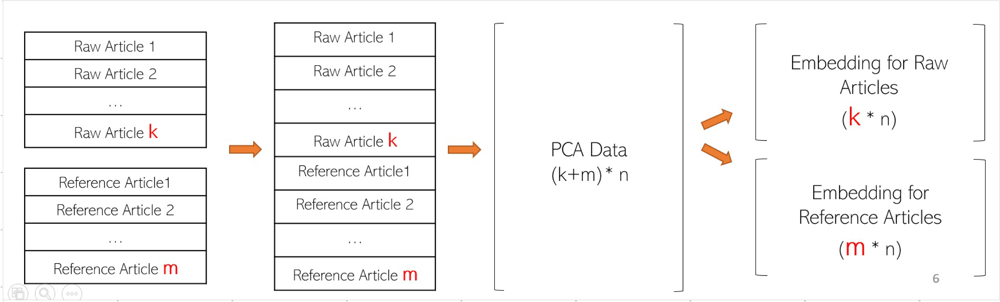

In [0]:
import matplotlib.image as mpimg 
import matplotlib.pyplot as plt

img = mpimg.imread('/content/drive/My Drive/DSL/images/pca.jpg') 
plt.figure()
plt.figure(figsize=(200,100))
plt.imshow(img) 

In [0]:
# combining both embeddings
# comb_embed = pd.concat([fraud_articles_embeddings_normalized, raw_articles_embeddings_normalized])

# # Standardizing the features
# x = StandardScaler().fit_transform(pca_embed)
# print(x.shape)

# pca = PCA(n_components=50)
# x_pca = pca.fit_transform(x)
# print(pca.explained_variance_ratio_)

# fraud_articles_embeddings_normalized = x_pca[:len(fraud_articles_embeddings), :]
# raw_articles_embeddings_normalized = x_pca[len(fraud_articles_embeddings):, :]

### Document Level Comparison

<Figure size 432x288 with 0 Axes>

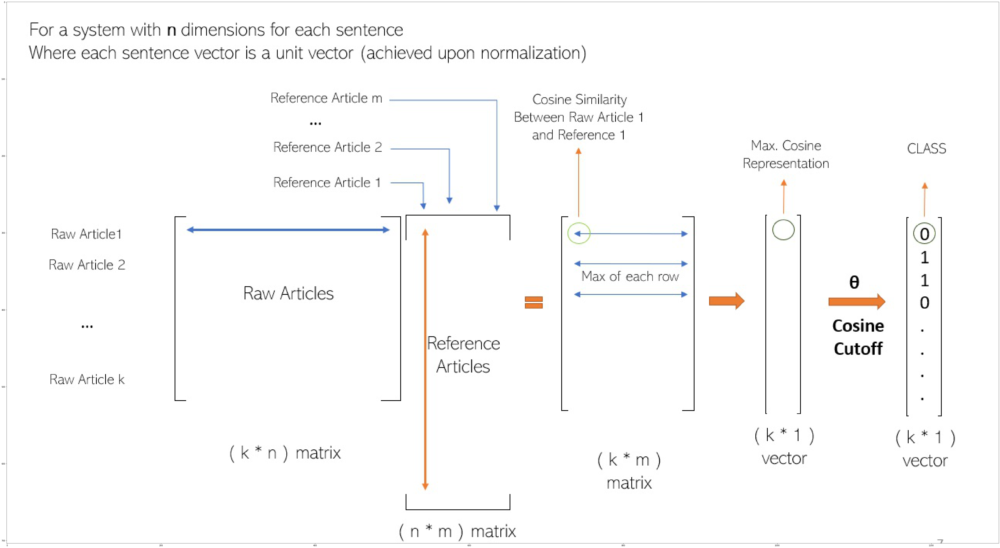

In [0]:
import matplotlib.image as mpimg 
import matplotlib.pyplot as plt

img = mpimg.imread('/content/drive/My Drive/DSL/images/similarity.jpg') 
plt.figure()
plt.figure(figsize=(100,50))
plt.imshow(img) 

In [0]:
fraud_articles_embeddings_normalized = preprocessing.normalize(fraud_articles_embeddings, norm='l2')
fraud_articles_embeddings_normalized = pd.DataFrame(fraud_articles_embeddings_normalized)

raw_articles_embeddings_normalized = preprocessing.normalize(raw_articles_embeddings, norm='l2')
raw_articles_embeddings_normalized = pd.DataFrame(raw_articles_embeddings_normalized)

In [0]:
cosine_vec = []

# -----------------------------------------------------------------------------------------------------------------------------

M = raw_articles_embeddings_normalized.dot(np.transpose(fraud_articles_embeddings_normalized))
print(M.shape)

cos_doc = (np.max(M, axis = 1))
cosine_vec = np.append(cosine_vec, cos_doc)

# -----------------------------------------------------------------------------------------------------------------------------

len(cosine_vec)

(50, 74)


50

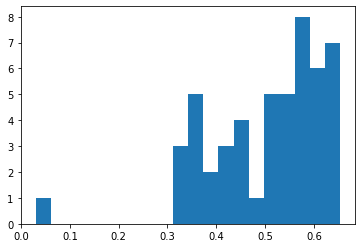

In [0]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# -----------------------------------------------------------------------------------------------------------------------------

plt.hist(cosine_vec, bins=20)
plt.show()

In [0]:
((data2.iloc[cosine_vec>=0.53])[['title']])

,title
5,"Fake firms, fake invoices and credit fraud — h..."
9,"1,200 exporters seeking GST refunds found missing"
24,GST Analytics wing to identify risky suppliers...
25,"Four arrested for Rs 400 cr GST fraud, ED migh..."
26,Revenue department detects 931 GST fraud cases...
27,"GST fraud of Rs 900 crore busted, three arrest..."
29,"4 Arrested For Rs 400 Crore GST fraud, Enforce..."
30,4 Arrested In Rs 60 Crore GST Fraud Case In Noida
31,"Rs 13 Crore GST Fraud Unearthed In Noida, Offi..."
32,2 Arrested For Rs 141 Crore GST Fraud In Chhat...


In [0]:
(standard_corpus.iloc[cosine_vec>=0.53])

,Unnamed: 0,links,class
5,5,https://theprint.in/economy/fake-firms-fake-in...,0.0
9,9,https://timesofindia.indiatimes.com/business/i...,0.0
24,24,https://economictimes.indiatimes.com/news/econ...,0.0
25,25,https://economictimes.indiatimes.com/news/poli...,1.0
26,26,https://economictimes.indiatimes.com/news/poli...,1.0
27,27,https://economictimes.indiatimes.com/news/poli...,1.0
29,29,https://www.ndtv.com/india-news/four-arrested-...,1.0
30,30,https://www.ndtv.com/noida-news/4-arrested-in-...,1.0
31,31,https://www.ndtv.com/noida-news/noida-uttar-pr...,1.0
32,32,https://www.ndtv.com/india-news/2-arrested-for...,1.0


### Model Result on Standard Corpus

In [0]:
(data2.iloc[cosine_vec>=0.53])[['title']]

,title,nltk_neg,nltk_pos
5,"Fake firms, fake invoices and credit fraud — h...",0.107,0.097
9,"1,200 exporters seeking GST refunds found missing",0.160,0.068
24,GST Analytics wing to identify risky suppliers...,0.074,0.121
25,"Four arrested for Rs 400 cr GST fraud, ED migh...",0.120,0.073
26,Revenue department detects 931 GST fraud cases...,0.143,0.054
27,"GST fraud of Rs 900 crore busted, three arrest...",0.126,0.112
29,"4 Arrested For Rs 400 Crore GST fraud, Enforce...",0.113,0.069
30,4 Arrested In Rs 60 Crore GST Fraud Case In Noida,0.152,0.089
31,"Rs 13 Crore GST Fraud Unearthed In Noida, Offi...",0.107,0.087
32,2 Arrested For Rs 141 Crore GST Fraud In Chhat...,0.158,0.045


In [0]:
(standard_corpus.iloc[cosine_vec>=0.53])

,Unnamed: 0,links,class
5,5,https://theprint.in/economy/fake-firms-fake-in...,0.0
9,9,https://timesofindia.indiatimes.com/business/i...,0.0
24,24,https://economictimes.indiatimes.com/news/econ...,0.0
25,25,https://economictimes.indiatimes.com/news/poli...,1.0
26,26,https://economictimes.indiatimes.com/news/poli...,1.0
27,27,https://economictimes.indiatimes.com/news/poli...,1.0
29,29,https://www.ndtv.com/india-news/four-arrested-...,1.0
30,30,https://www.ndtv.com/noida-news/4-arrested-in-...,1.0
31,31,https://www.ndtv.com/noida-news/noida-uttar-pr...,1.0
32,32,https://www.ndtv.com/india-news/2-arrested-for...,1.0


In [0]:
print(data2['title'][28], "\n", data2['title'][33], "\n", data2['title'][46])

GST authorities unearth racket involving Rs 140 cr tax fraud 
 Vijay Gutte, Director Of The Accidental Prime Minister Starring Anupam Kher As Manmohan Singh, Arrested For GST Fraud 
 GST authorities unearth racket involving Rs 140 crore tax fraud


central idea of the above articles were in praise of IT dept, or in a state of surprise. Hence the above articles were no longer relevenat for our case

# Part 2: EDA

In [0]:
scrapped_links = pd.read_csv("/content/drive/My Drive/DSL/links_only.csv")
print("We've Gathered", scrapped_links.shape[0],"number of relevant class articles\n\n")

# downloading scrapped articles
data = download_articles_data(set(scrapped_links['Links']))
print("Downloading Complete!\n")

# cleaning of articles
data_pickle_np = np.array(data['text'])
cleaned_text = []
for t in tqdm(data_pickle_np):
    cleaned_text.append(text_cleaner(t))
print("Cleaning Complete!")

data['cleaned_text'] = cleaned_text

  0%|          | 0/294 [00:00<?, ?it/s]

We've Gathered 295 number of relevant class articles




 38%|███▊      | 112/294 [02:06<02:35,  1.17it/s]/usr/local/lib/python3.6/dist-packages/dateutil/parser/_parser.py:1218: UnknownTimezoneWarning:

tzname IST identified but not understood.  Pass `tzinfos` argument in order to correctly return a timezone-aware datetime.  In a future version, this will raise an exception.

100%|██████████| 290/290 [00:00<00:00, 1738.75it/s]


Cleaning Complete!


In [0]:
data.columns

Index(['urls', 'title', 'keyword', 'text', 'summary', 'date', 'cleaned_text'], dtype='object')

In [0]:
# ------------------------------------------------------------------------------------------------------------------------------------------------

stop = stopwords.words('english')
st = PorterStemmer()
sid = SIA()

# ------------------------------------------------------------------------------------------------------------------------------------------------

data4 = pd.DataFrame()
data4['urls'] = data['urls']
data4['title'] = data['title']
data4['summary'] = data['summary']
data4['keyword'] = data['keyword']
data4['text'] = data['cleaned_text']
data4['dates'] = data['date']

# ------------------------------------------------------------------------------------------------------------------------------------------------

# dictionary contruction with type of sentiment conveyed based on summary
data4['nltk_dict'] = data['text'].apply(lambda x: sid.polarity_scores(x))
data4['nltk_compound'] = data4['nltk_dict'].apply(lambda x: x['compound'])
data4['nltk_neg'] = data4['nltk_dict'].apply(lambda x: x['neg'])
data4['nltk_pos'] = data4['nltk_dict'].apply(lambda x: x['pos'])
data4['nltk_neuteral'] = data4['nltk_dict'].apply(lambda x: x['neu'])

data4.drop(columns = ['nltk_dict'], inplace = True)

In [0]:
data4['ratio'] = data4['nltk_neg']/(data4['nltk_pos']+0.01)

In [0]:
# data4.to_csv("/content/drive/My Drive/DSL/complete_developed_corpus.csv")

### word cloud

<Figure size 432x288 with 0 Axes>

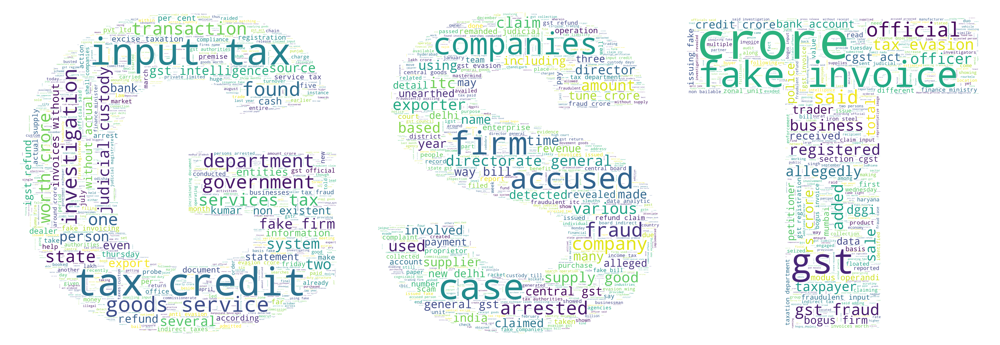

In [0]:
# text=("Data visualization or data visualisation is viewed by many disciplines as a modern equivalent of visual communication. It involves the creation and study of the visual representation of data, meaning information that has been abstracted in some schematic form, including attributes or variables for the units of information A primary goal of data visualization is to communicate information clearly and efficiently via statistical graphics, plots and information graphics. Numerical data may be encoded using dots, lines, or bars, to visually communicate a quantitative message.[2] Effective visualization helps users analyze and reason about data and evidence. It makes complex data more accessible, understandable and usable. Users may have particular analytical tasks, such as making comparisons or understanding causality, and the design principle of the graphic (i.e., showing comparisons or showing causality) follows the task. Tables are generally used where users will look up a specific measurement, while charts of various types are used to show patterns or relationships in the data for one or more variables")
text = ' '.join([text for text in data4['text']])
 
# Load the image
gst_mask = np.array(Image.open( "/content/drive/My Drive/DSL/images/ref 2.png"))

# Make the figure
wordcloud = WordCloud(width=480, height=480, mask = gst_mask, background_color="white", max_words=3000).generate(text)
plt.figure()
plt.figure(figsize=(200,100))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.margins(x=0, y=0)
plt.show()

### Sentiment

In [0]:
# -----------------------------------------------------------------------------------------------------------------------------
fig = px.histogram(data4, x="nltk_neg")
fig.show()
# -----------------------------------------------------------------------------------------------------------------------------
fig = px.histogram(data4, x="nltk_pos")
fig.show()
# -----------------------------------------------------------------------------------------------------------------------------
fig = px.histogram(data4, x="ratio")
fig.show()

In [0]:
# data4[data4['ratio'] <= .5]['title']

In [0]:
fig = go.Figure()

fig.add_trace(go.Histogram(x=data4['nltk_neg']))
fig.add_trace(go.Histogram(x=data4['nltk_pos']))
# fig.add_trace(go.Histogram(x=data4['ratio']))

# The two histograms are drawn on top of another
fig.update_layout(barmode='stack')
fig.show()

### Time Scale of Articles

In [0]:
fig = px.histogram(data, x="date")
fig.show()

### Co-Occurrency Graph

In [0]:
print('Tokenization\n')
data['tokenized_text'] = data['cleaned_text'].apply(lambda x: x.split())

stemmer = PorterStemmer()
lemmatizer = WordNetLemmatizer() 
data['lemma_text'] = (data['tokenized_text']).apply(lambda x: [lemmatizer.lemmatize(i) for i in x])

print(data['cleaned_text'].head())

print('\nLemmatizing\n')
print(data['lemma_text'].head())

text = []

for i in np.array(data['lemma_text']):
    text.append(' '.join(i))

data['tidy_text'] = text

Tokenization

0    representational image new delhi even two year...
1    text size noida uttar pradesh special task for...
2    story september representative image hyderabad...
3    officials directorate general gst intelligence...
4    services vat officer state goods andtax offici...
Name: cleaned_text, dtype: object

Lemmatizing

0    [representational, image, new, delhi, even, tw...
1    [text, size, noida, uttar, pradesh, special, t...
2    [story, september, representative, image, hyde...
3    [official, directorate, general, gst, intellig...
4    [service, vat, officer, state, good, andtax, o...
Name: lemma_text, dtype: object


#### Keyword Detection using TF.iDF

In [0]:
corpus_list = (data['tidy_text'])
tfidf_text = tfidf_embed(corpus_list)

tfidf_text.head()

,aaa,aadhaar,aahan,aamir,aamounting,aap,aaria,aastha,aatif,abatement,abc,abdul,abdullah,abeyance,abhishek,abide,abiding,ability,abiraame,able,abolish,abolished,abolition,abroad,absconded,absconding,absence,absent,absolute,absorbed,abuse,abusing,accept,acceptable,accepted,access,accessed,accessing,accessory,accidental,...,writing,written,wrong,wrongdoing,wrongful,wrongfully,wrongly,wrote,www,yadav,yalaka,yamuanangar,yan,yard,yarn,yashovardhan,year,yearly,years,yearthe,yediyurappa,yedukondalu,yeoh,yesterday,yet,yield,yielded,young,youth,youths,youtube,yudh,yudhishthira,yusuf,zee,zero,zeroed,zikshoo,zonal,zone
0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.041887,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.062085
1,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.077437,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.081648,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000
2,0.0,0.000000,0.0,0.0,0.0,0.0,0.254496,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000
3,0.0,0.078134,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.131415
4,0.0,0.090302,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000


In [0]:
temp = (pd.DataFrame(np.sum(tfidf_text, axis = 0)))
temp.columns = ['Weights']

keywords_extracted = (temp.sort_values(by=['Weights']).tail(100)).index
print(keywords_extracted)
# remove words: 'also', 'delhi', 'said', 'name', 'used', 'involving', 'non', 'worth', 'involved', 'two', 'pvt', 'private', 'rupee', 'crore', 'gst' 
# try to identify orgnaizations, places and remove them from the list

Index(['release', 'dealer', 'operation', 'invoicing', 'account', 'police',
       'ministry', 'year', 'three', 'per', 'revealed', 'according', 'data',
       'using', 'actual', 'tune', 'based', 'source', 'sale', 'created', 'igst',
       'entity', 'way', 'directorate', 'commissionerate', 'officer', 'added',
       'purchase', 'rs', 'unit', 'general', 'search', 'document', 'new',
       'revenue', 'detected', 'fraudulently', 'various', 'one', 'racket',
       'involving', 'non', 'custody', 'registered', 'business', 'availed',
       'section', 'name', 'act', 'director', 'used', 'amount', 'dggi',
       'statement', 'bank', 'issued', 'transaction', 'judicial', 'worth',
       'court', 'intelligence', 'supply', 'cgst', 'exporter', 'found', 'bill',
       'central', 'involved', 'two', 'fraudulent', 'government', 'state',
       'claim', 'service', 'person', 'delhi', 'investigation', 'also', 'itc',
       'department', 'refund', 'evasion', 'bogus', 'arrested', 'accused',
       'said', 'inp

In [0]:
use_words = []

for i in keywords_extracted:
    if i not in ['also', 'delhi', 'said', 'name', 'used', 'involving', 'non', 'worth', 'involved', 'two', 'pvt', 'private', 'rupee', 'crore', 'gst', 'rs', 'using', 'good', 'based', 'found', 'various', 'three', 'way', 'per']:
        use_words.append(i)
# use_words

In [0]:
import numpy as np
import nltk
from nltk import bigrams
import itertools
import pandas as pd
 
def generate_co_occurrence_matrix(corpus):
    vocab = set(corpus)
    vocab = list(vocab)
    vocab_index = {word: i for i, word in enumerate(vocab)}
 
    # Create bigrams from all words in corpus
    bi_grams = list(bigrams(corpus))
 
    # Frequency distribution of bigrams ((word1, word2), num_occurrences)
    bigram_freq = nltk.FreqDist(bi_grams).most_common(len(bi_grams))
 
    # Initialise co-occurrence matrix
    # co_occurrence_matrix[current][previous]
    co_occurrence_matrix = np.zeros((len(vocab), len(vocab)))
 
    # Loop through the bigrams taking the current and previous word,
    # and the number of occurrences of the bigram.
    for bigram in bigram_freq:
        current = bigram[0][1]
        previous = bigram[0][0]
        count = bigram[1]
        pos_current = vocab_index[current]
        pos_previous = vocab_index[previous]
        co_occurrence_matrix[pos_current][pos_previous] = count
    co_occurrence_matrix = np.matrix(co_occurrence_matrix)
 
    # return the matrix and the index
    return co_occurrence_matrix, vocab_index

df2 = list(itertools.chain.from_iterable(data['tokenized_text']))
matrix, vocab_index = generate_co_occurrence_matrix(df2)
 
data_matrix = pd.DataFrame(matrix, index=vocab_index,
                             columns=vocab_index)
print(data_matrix)

            loopholes.  persons.  case.  lakh.  ...  blog  pleaded  aim  departure.
loopholes.         0.0       0.0    0.0    0.0  ...   0.0      0.0  0.0         0.0
persons.           0.0       0.0    0.0    0.0  ...   0.0      0.0  0.0         0.0
case.              0.0       0.0    0.0    0.0  ...   0.0      0.0  0.0         0.0
lakh.              0.0       0.0    0.0    0.0  ...   0.0      0.0  0.0         0.0
rivals             0.0       0.0    0.0    0.0  ...   0.0      0.0  0.0         0.0
...                ...       ...    ...    ...  ...   ...      ...  ...         ...
prescribes         0.0       0.0    0.0    0.0  ...   0.0      0.0  0.0         0.0
blog               0.0       0.0    0.0    0.0  ...   0.0      0.0  0.0         0.0
pleaded            0.0       0.0    0.0    0.0  ...   0.0      0.0  0.0         0.0
aim                0.0       0.0    0.0    0.0  ...   0.0      0.0  0.0         0.0
departure.         0.0       0.0    0.0    0.0  ...   0.0      0.0  0.0     

In [0]:
data_matrix.loc[use_words, use_words]

,release,dealer,operation,invoicing,account,police,ministry,year,revealed,according,data,actual,tune,source,sale,created,igst,entity,directorate,commissionerate,officer,added,purchase,unit,general,search,document,new,revenue,detected,fraudulently,one,racket,custody,registered,business,availed,section,act,director,amount,dggi,statement,bank,issued,transaction,judicial,court,intelligence,supply,cgst,exporter,bill,central,fraudulent,government,state,claim,service,person,investigation,itc,department,refund,evasion,bogus,arrested,accused,input,case,official,fraud,credit,company,invoice,firm,fake,tax
release,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,9.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
dealer,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
operation,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,10.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
invoicing,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,42.0,0.0
account,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,10.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
company,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
invoice,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,15.0,3.0
firm,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0,0.0
fake,0.0,0.0,0.0,1.0,4.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,9.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0,0.0,0.0,9.0,0.0,3.0,0.0,6.0,0.0,0.0,0.0,3.0,0.0,0.0,0.0,26.0,1.0,0.0,0.0,1.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,9.0,0.0,0.0,0.0,1.0,1.0,0.0,2.0,6.0,0.0,0.0,0.0,12.0,0.0,2.0,8.0,1.0,0.0,0.0,0.0,1.0


### Amount Extraction

In [0]:
# corpus = ["the amount is 200.2 cr yo", "I got 27000 lakhs man!"]
# txt = ["The amount is 270-lakhs yo"]
# trans = "The amount is 270.2-lakhs yo"

def get_bigrams(text):
    vectorizer = TfidfVectorizer(ngram_range= (2,2))
    # temp = np.array(text)
    X = vectorizer.fit_transform([text])
    column_pairs = (vectorizer.get_feature_names())
    return column_pairs

def desired_bigram(bigram):
    gram_1 = (bigram.split(' '))[0]
    gram_2 = (bigram.split(' '))[1]
    if((gram_2 == 'cr') or (gram_2 == 'cr.') or (gram_2 == 'crore') or (gram_2 == 'crores') or (gram_2 == 'lakh') or (gram_2 == 'lakhs')):
        return True
    else:
        return False

def convert_to_values(bigram):
    gram_1 = (bigram.split(' '))[0]
    gram_2 = (bigram.split(' '))[1]
    try:
        if((gram_2 == 'cr') or (gram_2 == 'cr.') or (gram_2 == 'crore') or (gram_2 == 'crores')):
            return(float(gram_1)*100*100*1000)
        if((gram_2 == 'lakh') or (gram_2 == 'lakhs')):
            return(float(gram_1)*100*1000)
    except:
        return(np.nan)

# data['tokenized_2_text'] = data['cleaned_text'].apply(lambda x: x.split(' '))
# data['tokenized_2_title'] = data['title'].apply(lambda x: x.split(' '))

data['text_2'] = data['text'].apply(lambda x: x.replace(',', ''))
data['title_2'] = data['title'].apply(lambda x: x.replace(',', ''))

corpus_text = np.array(data['text_2'])
corpus_title = np.array(data['title_2'])

amounts_title = []
amounts_text = []

for txt in corpus_title:
    amt = []
    for i in get_bigrams(txt):
        # print(i)
        if desired_bigram(i) == True:
            amt.append(convert_to_values(i))
    try:
        amounts_title.append(max(amt))
    except:
        amounts_title.append(np.nan)

for txt in corpus_text:
    amt = []
    for i in get_bigrams(txt):
        # print(i)
        if desired_bigram(i) == True:
            amt.append(convert_to_values(i))
    try:
        amounts_text.append(max(amt))
    except:
        amounts_text.append(np.nan)


amounts_title
# for i in get_bigrams(txt):
#     if desired_bigram(i) == True:
#         print(i, ":", convert_to_values(i))

# get_bigrams(trans)
print(amounts_title)
# print(len(amounts), max(amounts), min(amounts))

[nan, nan, nan, nan, nan, 8000000000.0, nan, 280000000.0, 12000000000.0, nan, 4500000000.0, nan, 560000000.0, 690000000.0, nan, nan, nan, 60300000000.0, nan, 240000000.0, 600000000.0, nan, nan, 120000000.0, nan, nan, 1380000000.0, 120000000.0, 200000000.0, 280000000.0, 4500000000.0, 5430000000.0, 4000000000.0, nan, 3850000000.0, 4500000000.0, nan, 580000000.0, nan, 200000000000.0, nan, 960000000.0, 340000000.0, nan, 400000000000.0, nan, nan, 1100000000.0, 2120000000.0, 500000000.0, 919160000000.0, 550000000.0, 10000000000.0, 3800000.0, nan, 400000000.0, nan, nan, nan, nan, nan, nan, 700000000000.0, nan, 750000000.0, nan, 120000000.0, 2190000000.0, 3000000000.0, 41980000000.0, nan, 1230000000.0, nan, 380000000000.0, 600000000.0, 1150000000.0, nan, nan, 2410000000.0, 10570000000.0, nan, nan, nan, nan, 1770000000.0, 750000000.0, nan, 4400000000.0, 860000000.0, nan, nan, nan, 3500000000.0, 16000000000.0, nan, 410000000.0, 379460000000.0, nan, 310000000.0, 2140000000.0, nan, 1950000000.0, 1

In [0]:
index = 149
print(amounts_title[index])
(data['title'])[index]

nan


'Amit Mitra seeks probe into GST ‘fraud’'

In [0]:
amounts = amounts_title.copy()

for i in range(len(amounts_title)):
    temp = pd.DataFrame(amounts)
    
    if (temp.iloc[i].isna())[0]:
        # print(i)
        amounts[i] = amounts_text[i]

# print(data.shape)
# print(amounts_title)
# print(len(amounts_title))
# print(amounts_text)
# print(len(amounts_text))
# print(amounts)

(291, 14)
[nan, nan, nan, nan, nan, 8000000000.0, nan, 280000000.0, 12000000000.0, nan, 4500000000.0, nan, 560000000.0, 690000000.0, nan, nan, nan, 60300000000.0, nan, 240000000.0, 600000000.0, nan, nan, 120000000.0, nan, nan, 1380000000.0, 120000000.0, 200000000.0, 280000000.0, 4500000000.0, 5430000000.0, 4000000000.0, nan, 3850000000.0, 4500000000.0, nan, 580000000.0, nan, 200000000000.0, nan, 960000000.0, 340000000.0, nan, 400000000000.0, nan, nan, 1100000000.0, 2120000000.0, 500000000.0, 919160000000.0, 550000000.0, 10000000000.0, 3800000.0, nan, 400000000.0, nan, nan, nan, nan, nan, nan, 700000000000.0, nan, 750000000.0, nan, 120000000.0, 2190000000.0, 3000000000.0, 41980000000.0, nan, 1230000000.0, nan, 380000000000.0, 600000000.0, 1150000000.0, nan, nan, 2410000000.0, 10570000000.0, nan, nan, nan, nan, 1770000000.0, 750000000.0, nan, 4400000000.0, 860000000.0, nan, nan, nan, 3500000000.0, 16000000000.0, nan, 410000000.0, 379460000000.0, nan, 310000000.0, 2140000000.0, nan, 19500

In [0]:
temp = pd.DataFrame(amounts)
(temp.iloc[1].isna())[0]

True

In [0]:
print(amounts_text)
(data['text'].head(10))[1]

[nan, 400000000.0, 1000000000.0, 112510000000.0, nan, 16920000000.0, 35000000000.0, 35000000000.0, 12000000000.0, nan, 4500000000.0, 20000000000.0, 560000000.0, 690000000.0, 120000000000.0, 150000000.0, 550000000.0, 60300000000.0, 200000000000.0, 240000000.0, 600000000.0, nan, 6000000000.0, 820000000.0, nan, 4000000.0, 7430000000.0, 840000000.0, 4000000000.0, 35000000000.0, 4500000000.0, 5430000000.0, 10000000000.0, nan, 23640000000.0, 650000000000.0, 7430000000.0, 580000000.0, 4360000000.0, 200000000000.0, nan, 960000000.0, 2660000000.0, 110000000.0, 400000000000.0, 35000000000.0, nan, 1100000000.0, 6870000000.0, 500000000.0, 999390000000.0, 550000000.0, 10000000000.0, 860000000.0, 10000000000.0, nan, nan, 7210000000.0, 610000000.0, 95000000000.0, 8250000000.0, 3000000000.0, 702060000000.0, nan, 750000000.0, 1370000000.0, 300000000.0, 2190000000.0, 3000000000.0, 41980000000.0, nan, 6870000000.0, 60000000000.0, 379460000000.0, 6150000000.0, 1150000000.0, 5000000000.0, 200000000.0, 1600

'July 3, 2019\n\nMysuru: A city-based industrialist has been arrested by the GST (Goods & Services Tax) authorities on charges of tax fraud this morning.\n\nAnil Mehra, 59, proprietor of Spectra Pipes in Hootagalli Industrial Area, is the one who is arrested. Anil Mehra is said to have earned an Input Tax Credit of Rs. 7.5 crore, by submitting fake invoices of purchasing raw materials worth Rs. 40 crore. After getting the Rs.7.5 crore Input Tax Credit, Mehra is alleged to have fraudulently used this credit for despatching finished materials to buyers, in gross violation of GST rules and regulations.\n\nFollowing a tip off, a team of GST officials led by Additional Commissioner Y.C.S. Swamy and comprising Superintendents Bopanna, M.G. Krishnan and Gururaj, raided Spectra Pipes this morning, when the fraudulent means of GST tax evasion was unearthed, following which Anil Mehra was arrested.\n\nMehra was taken to K.R. Hospital and Jayadeva Cardiology Hospital for a medical check up. He wi

In [0]:
data['amounts'] = amounts

stop = stopwords.words('english')
st = PorterStemmer()
sid = SIA()

# dictionary contruction with type of sentiment conveyed based on summary
data['nltk_dict'] = data['text'].apply(lambda x: sid.polarity_scores(x))
data['nltk_compound'] = data['nltk_dict'].apply(lambda x: x['compound'])
data['nltk_neg'] = data['nltk_dict'].apply(lambda x: x['neg'])
data['nltk_pos'] = data['nltk_dict'].apply(lambda x: x['pos'])
data['nltk_neuteral'] = data['nltk_dict'].apply(lambda x: x['neu'])
data['ratio'] = data['nltk_neg']/(data['nltk_pos']+0.01)
# data4.drop(columns = ['nltk_dict'], inplace = True)

fig = px.histogram(data, x="ratio")
fig.show()

# Part 3: Topic Modelling

In [0]:
corpus_list = data4['text'].tolist()
len(corpus_list)

292

In [0]:
vec = CountVectorizer()
X = vec.fit_transform(corpus_list)
df = pd.DataFrame(X.toarray(), columns=vec.get_feature_names())
df.head()

,aaa,aadhaar,aadhar,aahan,aamir,aamounting,aap,aaria,aastha,aatif,abatement,abc,abdul,abdullah,abeyance,abhishek,abide,abiding,ability,abiraame,able,abolish,abolished,abolition,abroad,absconded,absconding,absence,absent,absolute,absorbed,abuse,abusing,accept,acceptable,accepted,access,accessed,accessing,accessories,...,wrong,wrongdoing,wrongful,wrongfully,wrongly,wrote,www,yadav,yalaka,yamuanangar,yan,yard,yarn,yashovardhan,year,yearly,years,yearthe,yediyurappa,yedukondalu,yeoh,yesterday,yet,yield,yielded,yields,young,youth,youths,youtube,yudh,yudhishthira,yusuf,zee,zero,zeroed,zikshoo,zonal,zone,zones
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
2,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0


In [0]:
tdm = df.transpose()
sparse_counts = scipy.sparse.csr_matrix(tdm)
corpus = matutils.Sparse2Corpus(sparse_counts)

def nouns(text):
    '''Given a string of text, tokenize the text and pull out only the nouns.'''
    is_noun = lambda pos: pos[:2] == 'NN'
    tokenized = word_tokenize(text)
    all_nouns = [word for (word, pos) in pos_tag(tokenized) if is_noun(pos)] 
    return ' '.join(all_nouns)

def nouns_adj(text):
    '''Given a string of text, tokenize the text and pull out only the nouns and adjectives.'''
    is_noun_adj = lambda pos: pos[:2] == 'NN' or pos[:2] == 'JJ'
    tokenized = word_tokenize(text)
    nouns_adj = [word for (word, pos) in pos_tag(tokenized) if is_noun_adj(pos)] 
    return ' '.join(nouns_adj)

# Read in the cleaned data, before the CountVectorizer step
data_clean = data['cleaned_text'] #pd.read_pickle('data_clean.pkl')
data_clean

# Apply the nouns function to the transcripts to filter only on nouns
data_nouns = pd.DataFrame(pd.DataFrame(data_clean).cleaned_text.apply(nouns_adj)) #.transcript.apply(nouns)
data_nouns

# Re-add the additional stop words since we are recreating the document-term matrix
add_stop_words = ['like', 'im', 'know', 'just', 'dont', 'thats', 'right', 'people',
                  'youre', 'got', 'gonna', 'time', 'think', 'yeah', 'said','click','join','subscribe','times']
stop_words = text.ENGLISH_STOP_WORDS.union(add_stop_words)

# Recreate a document-term matrix with only nouns
cvn = CountVectorizer(stop_words=stop_words,ngram_range=(1,1))
data_cvn = cvn.fit_transform(data_nouns.cleaned_text) #.transcript
data_dtmn = pd.DataFrame(data_cvn.toarray(), columns=cvn.get_feature_names())
data_dtmn.index = data_nouns.index
data_dtmn

# Create the gensim corpus
corpusn = matutils.Sparse2Corpus(scipy.sparse.csr_matrix(data_dtmn.transpose()))

# Create the vocabulary dictionary
id2wordn = dict((v, k) for k, v in cvn.vocabulary_.items())

# Let's start with 5 topics
ldan = models.LdaModel(corpus=corpusn, num_topics=5, id2word=id2wordn, passes=100)
ldan.print_topics()

[(0,
  '0.027*"tax" + 0.019*"gst" + 0.011*"crore" + 0.009*"government" + 0.009*"gstr" + 0.008*"credit" + 0.007*"taxes" + 0.007*"itc" + 0.007*"minister" + 0.006*"revenue"'),
 (1,
  '0.013*"gst" + 0.013*"fake" + 0.013*"firms" + 0.012*"companies" + 0.009*"invoices" + 0.008*"court" + 0.008*"petitioner" + 0.007*"bail" + 0.007*"investigation" + 0.006*"case"'),
 (2,
  '0.011*"court" + 0.007*"gst" + 0.006*"najib" + 0.006*"related" + 0.006*"case" + 0.005*"years" + 0.005*"bail" + 0.005*"iras" + 0.005*"accounts" + 0.005*"prosecution"'),
 (3,
  '0.033*"tax" + 0.030*"gst" + 0.021*"invoices" + 0.019*"fake" + 0.016*"crore" + 0.015*"goods" + 0.015*"credit" + 0.012*"firms" + 0.011*"input" + 0.010*"companies"'),
 (4,
  '0.024*"firms" + 0.023*"tax" + 0.021*"department" + 0.018*"crore" + 0.017*"gst" + 0.013*"bogus" + 0.013*"fake" + 0.011*"state" + 0.010*"goods" + 0.009*"input"')]

In [0]:
relev_word_list = ['gst','tax','fake','goods','case','credit','evasion','judicial','firms','bogus','invoice','illegal','crore','company','refund','claims', 'police','minister','arrest']

tf = TfidfVectorizer(smooth_idf = False, sublinear_tf = False, norm = None, analyzer = 'word', vocabulary = relev_word_list, use_idf = True)
txt_fitted = tf.fit(corpus_list)
txt_transformed = txt_fitted.transform(corpus_list)

# print idf values
df_idf = pd.DataFrame(tf.idf_, index=txt_fitted.get_feature_names(),columns=["idf_weights"])
 
# sort ascending
df_idf.sort_values(by=['idf_weights'])

,idf_weights
tax,1.063626
gst,1.078332
crore,1.208694
credit,1.310778
fake,1.315462
goods,1.373449
firms,1.633329
case,1.967224
evasion,1.967224
bogus,2.022793


# Part 4: Cluster Analysis

In [0]:
clust_features = bert_embed(data4['text'])
clust_features = pd.DataFrame(clust_features)

100%|██████████| 1.31G/1.31G [00:20<00:00, 65.1MB/s]


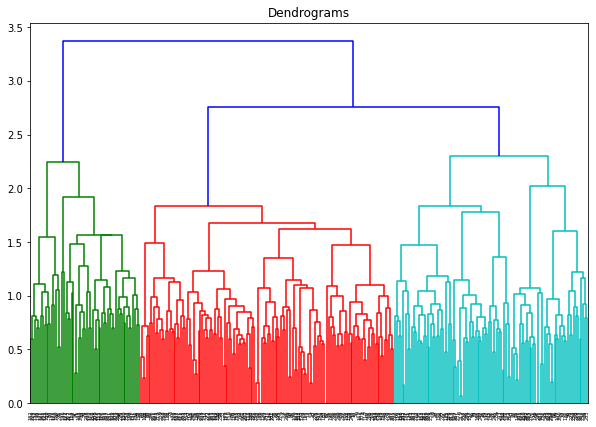

In [0]:
from sklearn.preprocessing import normalize
import scipy.cluster.hierarchy as shc

data_scaled = normalize(clust_features)
data_scaled = pd.DataFrame(data_scaled, columns=clust_features.columns)

plt.figure(figsize=(10, 7))  
plt.title("Dendrograms")
dend = shc.dendrogram(shc.linkage(data_scaled, method='ward'))

In [0]:
from sklearn.cluster import AgglomerativeClustering
cluster = AgglomerativeClustering(n_clusters=4, affinity='euclidean', linkage='ward')  
clust_label = cluster.fit_predict(data_scaled)

In [0]:
data4['clust_label'] = clust_label

In [0]:
data4['clust_label'].value_counts()

2    132
3     61
0     57
1     40
Name: clust_label, dtype: int64

In [0]:
# data4[data4['clust_label'] == 0]['text']

### Topic Modelling for clusters

In [0]:
relev_word_list = ['gst','tax','fake','goods','case','credit','evasion','judicial','firms','bogus','invoice','illegal','crore','company','refund','claims', 'police','minister','arrest']

for i in range(4):
    corpus_list = (data4[data4['clust_label'] == i]['text']).tolist()

    tf = TfidfVectorizer(smooth_idf = False, sublinear_tf = False, norm = None, analyzer = 'word', vocabulary = relev_word_list, use_idf = True)
    txt_fitted = tf.fit(corpus_list)
    txt_transformed = txt_fitted.transform(corpus_list)

    # print idf values
    df_idf = pd.DataFrame(tf.idf_, index=txt_fitted.get_feature_names(),columns=["idf_weights"])
    
    # sort ascending
    print(df_idf.sort_values(by=['idf_weights']))
    print("Result for cluster", i, "\n")

          idf_weights
gst          1.131028
tax          1.171850
crore        1.405465
goods        1.546544
fake         1.641854
evasion      1.641854
credit       1.675755
case         2.098612
minister     2.209838
firms        2.335001
claims       2.645156
refund       2.740466
invoice      2.845827
bogus        2.963610
company      2.963610
judicial     3.251292
arrest       3.433613
illegal      3.656757
police       4.349904
Result for cluster 0 

          idf_weights
gst          1.077962
tax          1.105361
crore        1.223144
fake         1.321584
goods        1.356675
credit       1.356675
firms        1.644357
bogus        1.980829
case         1.980829
judicial     2.123930
evasion      2.491655
company      2.491655
refund       2.897120
claims       2.897120
arrest       2.897120
police       3.079442
minister     3.995732
illegal      3.995732
invoice      4.688879
Result for cluster 1 

          idf_weights
tax          1.038615
gst          1.062520
crore   

# Model Fitting

In [0]:
articles = pd.read_csv('/content/drive/My Drive/DSL/Final_Corpus-1.csv', encoding= 'unicode_escape')

In [0]:
articles.head()

,Unnamed: 0,title,text,label,summary,cleaned_text,tax evasion fake invoices fake firms claims without receipt others,Unnamed: 7,Unnamed: 8,Unnamed: 9,Info,NA
0,0,Rs 1057 crore recovered in GST frauds across t...,Rs 1057 crore recovered in GST frauds across t...,INFO,The cases included 931 cases of fraudulent Inp...,crore recovered gst frauds across country sour...,NaN,NaN,tax evasion,understating sale,NaN,NaN
1,1,DGGI officials arrest two over massive GST fraud,Kolkata: Two persons have been arrested by the...,fake firms,Kolkata: Two persons have been arrested by the...,kolkata two persons arrested officials directo...,NaN,NaN,fake invoices,without actual goods transfer,NaN,NaN
2,2,Ex-director of 2 companies held over Rs 31 cr ...,Kolkata: A former director of two different co...,fake invoices,Santosh Kumar alias Shudangshu Kumar was the f...,kolkata former director two different companie...,NaN,NaN,fake firms,fake transactions,NaN,NaN
3,3,CGST's Anti-Evasion Wing busts Rs 241 cr GST f...,New Delhi: The Anti-Evasion wing of the Centra...,fake invoices,New Delhi: The Anti-Evasion wing of the Centra...,new delhi anti evasion wing central gst delhi ...,NaN,NaN,claims without receipt,NaN,NaN,NaN
4,4,Two held for fraud under GST Act in Delhi,"May 24, 2018 , 1:38PM Two held for fraud under...",fake invoices,"May 24, 2018 , 1:38PM Two held for fraud under...",may two held fraud gst act delhi central goods...,NaN,NaN,others,NaN,NaN,NaN


In [0]:
articles['cleaned_text'] = articles['cleaned_text'].astype(str)

In [0]:
#call text cleaning function
cleaned_text = []
for text in tqdm(articles['text']):
  cleaned_text.append(text_cleaner(text))
articles['cleaned_text'] = cleaned_text

100%|██████████| 311/311 [00:00<00:00, 2188.56it/s]


In [0]:
from sentence_transformers import SentenceTransformer
model = SentenceTransformer('roberta-large-nli-stsb-mean-tokens')

sentences = np.array(articles['text'])

sentence_embeddings = model.encode((sentences))

In [0]:
from sklearn.feature_extraction.text import TfidfVectorizer
import gensim
from sklearn import preprocessing
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.feature_extraction.text import CountVectorizer
from gensim import matutils, models
import scipy.sparse

In [0]:
clust_features = (pd.DataFrame(sentence_embeddings))

In [0]:
clust_features.shape

(311, 1024)

In [0]:
y = np.array(articles['label'])

In [0]:
articles['label'].fillna("NA", inplace = True)

In [0]:
articles['label'].value_counts()

fake firms                114
fake invoices              63
other                      47
NA                         35
tax evasion                21
info                       16
INFO                       10
claims without receipt      5
Name: label, dtype: int64

In [0]:
y = articles['label_2']

In [0]:
articles['label'].isna().sum()

35

In [0]:
mapping = {'fake firms': 0, 'fake invoices': 1, 'other':2,'tax evasion':2, 'info':2, 'INFO':2, 'claims without receipt':1, "NA": 2}
articles['label_2'] = articles['label'].map(mapping)
print(articles['label_2'].value_counts())
y = articles['label_2']

2    129
0    114
1     68
Name: label_2, dtype: int64


In [0]:
x = StandardScaler().fit_transform(clust_features)
print(x.shape)

pca = PCA(n_components=30)
x_pca = pca.fit_transform(x)
print(pca.explained_variance_ratio_.sum())
print(x_pca.shape)

X_train = x_pca[:250]
X_test = x_pca[250:]

y_train = y[:250]
y_test = y[250:]

(311, 1024)
0.6833806804132291
(311, 30)


### Best Model

In [0]:
model = RandomForestClassifier()

model.fit(X_train, y_train)
model.score(X_test, y_test)

0.7377049180327869

In [0]:
y_test_pred = model.predict(X_test)
p_score = metrics.precision_score(y_test, y_test_pred, average = 'weighted')
r_score = metrics.recall_score(y_test, y_test_pred, average = 'weighted')
f1_score = metrics.f1_score(y_test, y_test_pred, average = 'weighted')
print("Precision:",p_score)
print("Recall:",r_score)
print("F1:",f1_score)

Precision: 0.7367291178766588
Recall: 0.7377049180327869
F1: 0.7264545162327226
